In [1]:
push!(LOAD_PATH, pwd());
using SelfDrivingFilters
using Distributions
using VariableTransforms
using Gadfly
using DataFrames
using Optim
using Statistics: mean, var
using LinearAlgebra
using SpecialFunctions
include("helper_functions.jl")

plot_models (generic function with 2 methods)

# Criterion setup 

In [17]:
function ll_mvt(parameters, data_t)
    σ1²=from_R_to_pos(parameters[1]);
    σ2²=from_R_to_pos(parameters[2]);
    ρ=2*from_R_to_11(parameters[3])-1.
    ν=from_R_to_pos(parameters[4])+2;

    ϵ=reshape(data_t, :, 1)

    N=2
    νᴺ=ν+N
    R=[
        1. ρ
        ρ  1.
    ]
    detR=det(R)
    Rinv=one(R); Rinv[1,2]=Rinv[2,1]=-ρ; Rinv*=1/detR

    d=[sqrt(σ1²);sqrt(σ2²)]
    detD=prod(d)

    ϵstd=ϵ./d
    try
        ll=loggamma(νᴺ/2)-loggamma(ν/2)-N/2*log(π*ν)-0.5*log(detR)-log(detD)-νᴺ/2*log(1+1/ν * (ϵstd'*Rinv*ϵstd)[1])
        return -ll
    catch
        return Inf
    end
end

ll_mvt (generic function with 1 method)

# Simulated data 

## Time-varying scale

In [3]:
function get_data_mvt(path)
    σ1=path[1]
    σ2=path[2]
    ρ=path[3]
    ν=path[4]
    Σ=[
        σ1^2     σ1*σ2*ρ
        σ1*σ2*ρ  σ2^2
    ]
    dd=MvTDist(ν,zeros(2),Σ)
    rand(dd)[:]
end

get_data_mvt (generic function with 1 method)

In [4]:
T=10000
σ21=structural_breaks(T,[0.5,4.0],[1,2])
σ22=structural_breaks(T,[4.0,0.5],[2,1])
ρ=fill(0.5,T)
ν=fill(7.5,T)
d=Matrix(hcat([get_data_mvt([sqrt(i),sqrt(j),k,l]) for (i,j,k,l) in zip(σ21,σ22,ρ,ν)]...)');
true_paths=[σ21 σ22 ρ ν]';

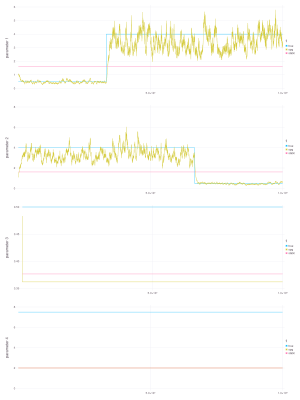

In [5]:
#Self-driving
tv_ix=[true;true;false;false]
model=define_model(
    tv_ix,
    ll_mvt;
    parameter_transforms=(
        (1, x->from_R_to_pos.(x)),
        (2, x->from_R_to_pos.(x)),
        (3, x->2 .*from_R_to_11.(x).-1),
        (4, x->from_R_to_pos.(x).+2.),
    ),
    filter_type=:sparse,
    scaling_options=(:opg,0.99),
    init_options=:static
)
add_data!(model, d)
ω = [from_pos_to_R.(var(d; dims=1))[:];from_11_to_R(0.0);from_pos_to_R(20-2)]
fit!(model, ω; As=[0.01;0.02], Bs=[0.99;0.98]);

plot_models(true_paths, Dict(
    :static=>model.results.static,
    :opg=>model.results.best,
))

In [6]:
models=Dict{Any,Any}()
#Self-driving
for scaling_options in (
#         (:hessian, 0.99),
#         (:robust, 0.99),
        (:opg, 0.99),
        (:unit,),
    )
    tv_ix=[true;true;false;false]
    model=define_model(
        tv_ix,
        ll_mvt;
        parameter_transforms=(
            (1, x->from_R_to_pos.(x)),
            (2, x->from_R_to_pos.(x)),
            (3, x->2 .*from_R_to_11.(x).-1),
            (4, x->from_R_to_pos.(x).+2.),
        ),
        filter_type=:sparse,
        scaling_options=scaling_options,
        init_options=:static
    )
    add_data!(model, d)
    ω = [from_pos_to_R.(var(d; dims=1))[:];from_11_to_R(0.0);from_pos_to_R(20-2)]
    add_data!(model, d)
    fit!(model, ω; As=[0.01;0.02], Bs=[0.99;0.98]);
    models[:static]=model.results.static
    models[scaling_options[1]]=model.results.best
end
plot_models(true_paths, models)

## Time-varying scale and correlation

In [13]:
T=10000
σ21=structural_breaks(T,[0.5,4.0],[1,2])
σ22=structural_breaks(T,[4.0,0.5],[2,1])
ρ=sinusoid(T,0.5,1)
ν=fill(7.5,T)
d=Matrix(hcat([get_data_mvt([sqrt(i),sqrt(j),k,l]) for (i,j,k,l) in zip(σ21,σ22,ρ,ν)]...)');
true_paths=[σ21 σ22 ρ ν]';

In [18]:
models=Dict{Any,Any}()
#Self-driving
for scaling_options in (
#         (:hessian, 0.99),
#         (:robust, 0.99),
        (:opg, 0.99),
        (:unit,),
    )
    tv_ix=[true;true;true;false]
    model=define_model(
        tv_ix,
        ll_mvt;
        parameter_transforms=(
            (1, x->from_R_to_pos.(x)),
            (2, x->from_R_to_pos.(x)),
            (3, x->2 .*from_R_to_11.(x).-1),
            (4, x->from_R_to_pos.(x).+2.),
        ),
        filter_type=:sparse,
        scaling_options=scaling_options,
        init_options=:static
    )
    add_data!(model, d)
    ω = [from_pos_to_R.(var(d; dims=1))[:];from_11_to_R(0.0);from_pos_to_R(20-2)]
    add_data!(model, d)
    fit!(model, ω; As=[0.01;0.02], Bs=[0.99;0.98]);
    models[:static]=model.results.static
    models[scaling_options[1]]=model.results.best
end
plot_models(true_paths, models)

# S&P500 & DAX

In [19]:
using CSV
df=open("market_data.csv","r") do f
    CSV.read(f, DataFrame)
end
d=df[:,[:SP500,:DAX]]
d=convert(Array{Float64,2}, d)
first(df,5)

,Date,DAX,SP500
,Date…,Float64,Float64
1,1990-01-03,3.00128,-0.258891
2,1990-01-04,-1.82327,-0.865031
3,1990-01-05,-0.868743,-0.980414
4,1990-01-08,1.2683,0.450432
5,1990-01-09,1.22455,-1.18567


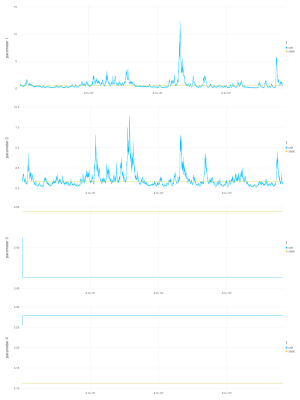

In [20]:
models=Dict{Any,Any}()
#Self-driving
tv_ix=[true;true;false;false]
model=define_model(
    tv_ix,
    ll_mvt;
    parameter_transforms=(
        (1, x->from_R_to_pos.(x)),
        (2, x->from_R_to_pos.(x)),
        (3, x->2 .*from_R_to_11.(x).-1),
        (4, x->from_R_to_pos.(x).+2.),
    ),
    filter_type=:sparse,
    scaling_options=:unit,
    init_options=:static
)
add_data!(model, d)
ω = [from_pos_to_R.(var(d; dims=1))[:];from_11_to_R(0.4);from_pos_to_R(20-2)]
add_data!(model, d)
fit!(model, ω; As=[0.01;0.02], Bs=[0.99;0.98]);
models[:static]=model.results.static
models[:unit]=model.results.best
plot_models(models)

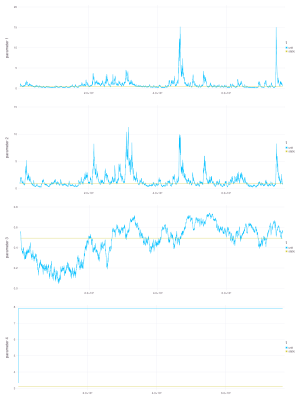

In [21]:
models=Dict{Any,Any}()
#Self-driving
tv_ix=[true;true;true;false]
model=define_model(
    tv_ix,
    ll_mvt;
    parameter_transforms=(
        (1, x->from_R_to_pos.(x)),
        (2, x->from_R_to_pos.(x)),
        (3, x->2 .*from_R_to_11.(x).-1),
        (4, x->from_R_to_pos.(x).+2.),
    ),
    filter_type=:sparse,
    scaling_options=:unit,
    init_options=:static
)
add_data!(model, d)
ω = [from_pos_to_R.(var(d; dims=1))[:];from_11_to_R(0.4);from_pos_to_R(20-2)]
add_data!(model, d)
fit!(model, ω; As=[0.01;0.02], Bs=[0.99;0.98]);
models[:static]=model.results.static
models[:unit]=model.results.best
plot_models(models)